In [610]:
import pandas as pd
import numpy as np
import os
import sys
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import re

In [611]:
df = pd.read_pickle("lending_club_dataset.pickle")
current_directory = os.path.abspath(os.getcwd())
file_path_file = os.path.join(current_directory, 'lending_club_dataset.pickle')
file_df = pd.read_pickle(file_path_file)
with open("lending_club_dataset.pickle", 'rb') as file:
    data, discrete_features, continuous_features = pickle.load(file)

In [612]:
# Get list of discrete and continuous features
discrete_features = []
continuous_features = []
for column in data.columns:
    if data[column].dtype == 'object':
        discrete_features.append(column)
    else:
        continuous_features.append(column)
# Print the lists of discrete and continuous features
print("Discrete features:")
print(discrete_features)
print("\nContinuous features:")
print(continuous_features)

# check for categorical features
categorical_features = data.select_dtypes(include=['object']).columns.tolist()
print("Categorical features:")
print(categorical_features)

Discrete features:
['id', 'term', 'grade', 'emp_length', 'home_ownership', 'verification_status', 'issue_d', 'loan_status', 'purpose', 'earliest_cr_line', 'last_pymnt_d']

Continuous features:
['loan_amnt', 'funded_amnt', 'int_rate', 'installment', 'annual_inc', 'dti', 'delinq_2yrs', 'open_acc', 'pub_rec', 'fico_range_high', 'fico_range_low', 'revol_bal', 'revol_util', 'total_pymnt', 'recoveries', 'loan_length', 'term_num', 'ret_PESS', 'ret_OPT', 'ret_INTa', 'ret_INTb', 'ret_INTc']
Categorical features:
['id', 'term', 'grade', 'emp_length', 'home_ownership', 'verification_status', 'issue_d', 'loan_status', 'purpose', 'earliest_cr_line', 'last_pymnt_d']


In [613]:
data.describe()



,loan_amnt,funded_amnt,int_rate,installment,annual_inc,dti,delinq_2yrs,open_acc,pub_rec,fico_range_high,...,revol_util,total_pymnt,recoveries,loan_length,term_num,ret_PESS,ret_OPT,ret_INTa,ret_INTb,ret_INTc
count,605374.000000,605374.000000,605374.00000,605374.000000,6.053740e+05,605374.000000,605374.000000,605374.000000,605374.000000,605374.000000,...,605374.000000,605374.000000,605374.000000,605374.000000,605374.000000,605374.000000,605374.000000,605374.000000,605374.000000,605374.000000
mean,14552.362506,14552.362506,12.69876,439.151480,7.687993e+04,18.969691,0.338577,11.846685,0.239870,699.438314,...,50.717241,14601.370444,254.129004,20.106174,41.682464,0.005759,0.045801,0.012465,0.028547,0.058141
std,8795.106114,8795.106114,4.77739,262.995589,7.277882e+04,11.783039,0.920335,5.676809,0.641496,31.856039,...,24.453887,10175.431179,982.899170,11.594011,10.202397,0.082310,0.107628,0.060556,0.064719,0.072475
min,1000.000000,1000.000000,5.31000,14.010000,1.600000e+01,-1.000000,0.000000,1.000000,0.000000,664.000000,...,0.000000,17.580000,0.000000,0.919937,36.000000,-0.333083,-0.333083,-0.199841,-0.199827,-0.199801
25%,8000.000000,8000.000000,9.17000,248.442500,4.571275e+04,12.190000,0.000000,8.000000,0.000000,674.000000,...,32.300000,6704.651477,0.000000,10.020740,36.000000,0.009038,0.036616,0.018124,0.037480,0.071395
50%,12000.000000,12000.000000,12.29000,373.920000,6.500000e+04,18.200000,0.000000,11.000000,0.000000,694.000000,...,50.600000,11909.215060,0.000000,18.990123,36.000000,0.032468,0.068647,0.031701,0.049552,0.082138
75%,20000.000000,20000.000000,15.59000,583.890000,9.181350e+04,24.980000,0.000000,15.000000,0.000000,714.000000,...,69.300000,20320.256235,0.000000,31.047865,36.000000,0.051713,0.105569,0.045422,0.063087,0.095792
max,40000.000000,40000.000000,30.99000,1719.830000,9.550000e+06,999.000000,39.000000,90.000000,86.000000,850.000000,...,193.000000,61184.573800,35581.880000,49.939424,60.000000,0.180332,1.628427,0.171967,0.194177,0.234413


In [615]:
data.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,...,total_pymnt,last_pymnt_d,recoveries,loan_length,term_num,ret_PESS,ret_OPT,ret_INTa,ret_INTb,ret_INTc
0,40390412,5000.0,5000.0,36 months,12.39,167.01,C,< 1 year,RENT,48000.0,...,5475.14000,2015-12-01,0.0,10.973531,36,0.031676,0.103917,0.031155,0.050634,0.086751
2,40401108,17000.0,17000.0,36 months,12.39,567.82,C,1 year,RENT,53000.0,...,20452.09912,2018-03-01,0.0,37.947391,36,0.067688,0.064215,0.050574,0.066334,0.094950
3,40501689,9000.0,9000.0,36 months,14.31,308.96,C,6 years,RENT,39000.0,...,9792.56000,2015-11-01,0.0,9.987885,36,0.029354,0.105803,0.029798,0.049345,0.085622
4,40352737,14000.0,14000.0,36 months,11.99,464.94,B,6 years,RENT,44000.0,...,16592.91130,2018-01-01,0.0,36.008953,36,0.061736,0.061721,0.047093,0.063007,0.091937
5,40431323,10000.0,10000.0,60 months,19.24,260.73,E,10+ years,MORTGAGE,130000.0,...,15122.07997,2018-10-01,0.0,44.978336,60,0.102442,0.136655,0.113866,0.131897,0.164518


In [616]:
data.columns
data.describe()
data.info()
data.shape

<class 'pandas.core.frame.DataFrame'>
Int64Index: 605374 entries, 0 to 1048541
Data columns (total 33 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   605374 non-null  object 
 1   loan_amnt            605374 non-null  float64
 2   funded_amnt          605374 non-null  float64
 3   term                 605374 non-null  object 
 4   int_rate             605374 non-null  float64
 5   installment          605374 non-null  float64
 6   grade                605374 non-null  object 
 7   emp_length           567483 non-null  object 
 8   home_ownership       605374 non-null  object 
 9   annual_inc           605374 non-null  float64
 10  verification_status  605374 non-null  object 
 11  issue_d              605374 non-null  object 
 12  loan_status          605374 non-null  object 
 13  purpose              605374 non-null  object 
 14  dti                  605374 non-null  float64
 15  delinq_2yrs     

(605374, 33)

In [617]:
# check for categorical features
categorical_features = data.select_dtypes(include=['object']).columns
print("Categorical features:")      
print(categorical_features)

Categorical features:
Index(['id', 'term', 'grade', 'emp_length', 'home_ownership',
       'verification_status', 'issue_d', 'loan_status', 'purpose',
       'earliest_cr_line', 'last_pymnt_d'],
      dtype='object')


/var/folders/kt/ry010nkj2zd41r24ymxpkbdm0000gn/T/ipykernel_63259/246421813.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = data.corr()


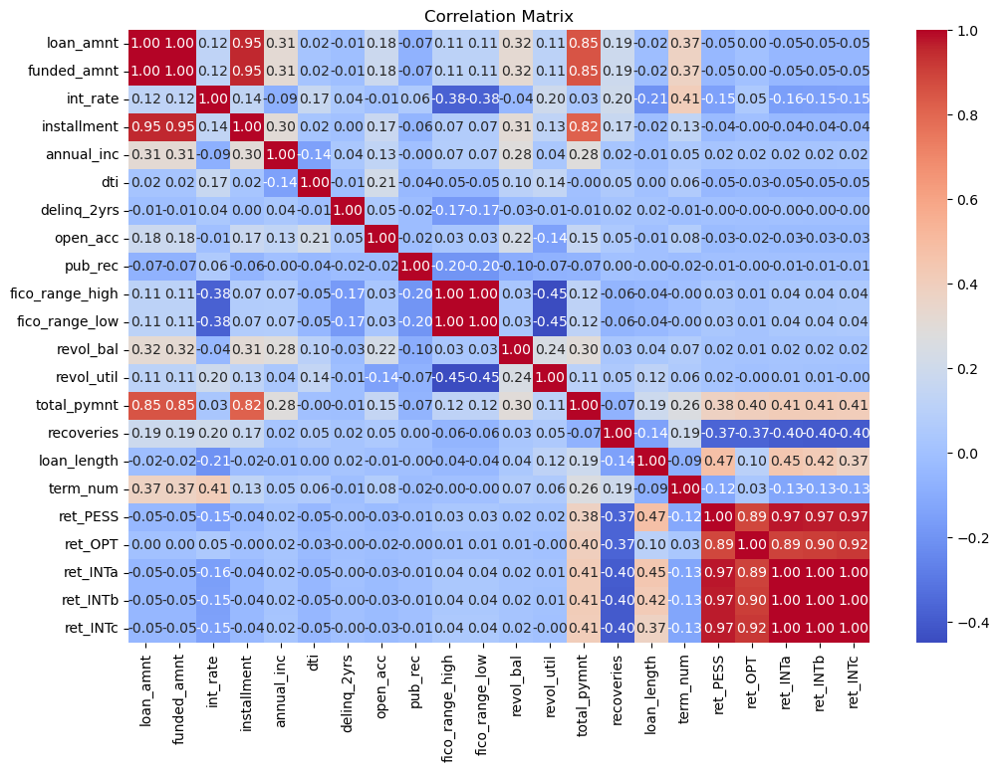

In [618]:
# check for correlation
correlation_matrix = data.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

In [619]:
# remove highly correlated features
threshold = 0.9
correlated_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)
print("Correlated features:")   
print(correlated_features)


Correlated features:
{'installment', 'ret_INTa', 'fico_range_low', 'ret_INTc', 'ret_INTb', 'funded_amnt'}


In [620]:

#check for outliers
outliers_count = {}
for column in continuous_features:
    Q1 = data[column].quantile(0.15)
    Q3 = data[column].quantile(0.85)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers_count[column] = ((data[column] < lower_bound) | (data[column] > upper_bound)).sum()
print("Number of outliers in each continuous feature:")
print(outliers_count)
# show percentage of outliers over all values for each feature
outliers_percentage = {column: (count / len(data)) * 100 for column, count in outliers_count.items()}
print("Percentage of outliers in each continuous feature:")
print(outliers_percentage)
# remove outliers (except recoveries)
for column in continuous_features:
    if column != 'recoveries':
        Q1 = data[column].quantile(0.15)
        Q3 = data[column].quantile(0.85)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        data = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]

# shape of the data after removing outliers
print("Shape of the data after removing outliers:")
print(data.shape)

Number of outliers in each continuous feature:
{'loan_amnt': 0, 'funded_amnt': 0, 'int_rate': 0, 'installment': 55, 'annual_inc': 11378, 'dti': 1060, 'delinq_2yrs': 17941, 'open_acc': 3546, 'pub_rec': 6909, 'fico_range_high': 1934, 'fico_range_low': 1934, 'revol_bal': 15201, 'revol_util': 3, 'total_pymnt': 35, 'recoveries': 82361, 'loan_length': 0, 'term_num': 0, 'ret_PESS': 1291, 'ret_OPT': 110, 'ret_INTa': 0, 'ret_INTb': 0, 'ret_INTc': 0}
Percentage of outliers in each continuous feature:
{'loan_amnt': 0.0, 'funded_amnt': 0.0, 'int_rate': 0.0, 'installment': 0.0090852927281317, 'annual_inc': 1.8794992847396816, 'dti': 0.1750983689421746, 'delinq_2yrs': 2.963622487916561, 'open_acc': 0.5857536002537275, 'pub_rec': 1.141277953793853, 'fico_range_high': 0.3194719297492129, 'fico_range_low': 0.3194719297492129, 'revol_bal': 2.5110097229150905, 'revol_util': 0.0004955614215344564, 'total_pymnt': 0.005781549917901991, 'recoveries': 13.604978079666456, 'loan_length': 0.0, 'term_num': 0.0, '

In [622]:
data['recoveries'].unique()

array([   0.  , 1070.96, 1669.52, ..., 1383.25, 4277.18,  626.92])

In [623]:
missing_columns = data.isnull().sum().sort_values(ascending= False)
missing_columns

emp_length             35094
id                         0
recoveries                 0
fico_range_high            0
fico_range_low             0
revol_bal                  0
revol_util                 0
total_pymnt                0
last_pymnt_d               0
loan_length                0
open_acc                   0
term_num                   0
ret_PESS                   0
ret_OPT                    0
ret_INTa                   0
ret_INTb                   0
pub_rec                    0
earliest_cr_line           0
loan_amnt                  0
delinq_2yrs                0
dti                        0
purpose                    0
loan_status                0
issue_d                    0
verification_status        0
annual_inc                 0
home_ownership             0
grade                      0
installment                0
int_rate                   0
term                       0
funded_amnt                0
ret_INTc                   0
dtype: int64

In [624]:
# remove columns with more than 50% missing values
missing_threshold = 0.5
missing_columns = data.isnull().mean()
columns_to_remove = missing_columns[missing_columns > missing_threshold].index
data = data.drop(columns=columns_to_remove)
data.columns

Index(['id', 'loan_amnt', 'funded_amnt', 'term', 'int_rate', 'installment',
       'grade', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'purpose', 'dti',
       'delinq_2yrs', 'earliest_cr_line', 'open_acc', 'pub_rec',
       'fico_range_high', 'fico_range_low', 'revol_bal', 'revol_util',
       'total_pymnt', 'last_pymnt_d', 'recoveries', 'loan_length', 'term_num',
       'ret_PESS', 'ret_OPT', 'ret_INTa', 'ret_INTb', 'ret_INTc'],
      dtype='object')

In [625]:
data.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,...,total_pymnt,last_pymnt_d,recoveries,loan_length,term_num,ret_PESS,ret_OPT,ret_INTa,ret_INTb,ret_INTc
0,40390412,5000.0,5000.0,36 months,12.39,167.01,C,< 1 year,RENT,48000.0,...,5475.14000,2015-12-01,0.0,10.973531,36,0.031676,0.103917,0.031155,0.050634,0.086751
2,40401108,17000.0,17000.0,36 months,12.39,567.82,C,1 year,RENT,53000.0,...,20452.09912,2018-03-01,0.0,37.947391,36,0.067688,0.064215,0.050574,0.066334,0.094950
3,40501689,9000.0,9000.0,36 months,14.31,308.96,C,6 years,RENT,39000.0,...,9792.56000,2015-11-01,0.0,9.987885,36,0.029354,0.105803,0.029798,0.049345,0.085622
4,40352737,14000.0,14000.0,36 months,11.99,464.94,B,6 years,RENT,44000.0,...,16592.91130,2018-01-01,0.0,36.008953,36,0.061736,0.061721,0.047093,0.063007,0.091937
5,40431323,10000.0,10000.0,60 months,19.24,260.73,E,10+ years,MORTGAGE,130000.0,...,15122.07997,2018-10-01,0.0,44.978336,60,0.102442,0.136655,0.113866,0.131897,0.164518


In [626]:
# feature engineering
data['issue_d'] = pd.to_datetime(data['issue_d'])
data['earliest_cr_line'] = pd.to_datetime(data['earliest_cr_line'])
print("Earliest credit line date:") 
print(data['earliest_cr_line'].min())
print("Latest issue date:")
print(data['issue_d'].max())
# Compute credit age in years (or months)
data['credit_age_yrs'] = (data['issue_d'] - data['earliest_cr_line']).dt.days / 365.25
print("Credit age in years:")
print(data['credit_age_yrs'].describe())
# Remove the original columns
data = data.drop(columns=['issue_d', 'earliest_cr_line'])
# Convert to numeric
data['credit_age_yrs'] = pd.to_numeric(data['credit_age_yrs'], errors='coerce')
# Remove rows with NaN values
data = data.dropna(subset=['credit_age_yrs'])
# Check for missing values again
missing_values = data.isnull().sum()
print("Missing values after processing:")
print(missing_values[missing_values > 0])


Earliest credit line date:
1969-01-01 00:00:00
Latest issue date:
2018-09-01 00:00:00
Credit age in years:
count    550923.000000
mean         15.920904
std           7.938250
min         -53.916496
25%          11.082820
50%          14.584531
75%          19.832991
max          49.251198
Name: credit_age_yrs, dtype: float64
Missing values after processing:
emp_length    35094
dtype: int64


In [627]:
# drop term column
data = data.drop(columns=['term','ret_PESS','ret_OPT','ret_INTa', 'ret_INTb','ret_INTc','id','last_pymnt_d'])



In [628]:
# check for categorical features
categorical_features = data.select_dtypes(include=['object']).columns
print("Categorical features:")  
print(categorical_features)
# check for unique values in categorical features
unique_values = {}
for column in categorical_features:
    unique_values[column] = data[column].unique()
print("Unique values in categorical features:")
print(unique_values)

Categorical features:
Index(['grade', 'emp_length', 'home_ownership', 'verification_status',
       'loan_status', 'purpose'],
      dtype='object')
Unique values in categorical features:
{'grade': array(['C', 'B', 'E', 'A', 'D', 'F', 'G'], dtype=object), 'emp_length': array(['< 1 year', '1 year', '6 years', '10+ years', '2 years', '3 years',
       '5 years', '7 years', '4 years', '9 years', '8 years', None],
      dtype=object), 'home_ownership': array(['RENT', 'MORTGAGE', 'OWN', 'ANY', 'NONE'], dtype=object), 'verification_status': array(['Not Verified', 'Source Verified', 'Verified'], dtype=object), 'loan_status': array(['Fully Paid', 'Charged Off', 'Default'], dtype=object), 'purpose': array(['debt_consolidation', 'credit_card', 'medical', 'home_improvement',
       'moving', 'other', 'major_purchase', 'vacation', 'small_business',
       'car', 'renewable_energy', 'house', 'wedding'], dtype=object)}


In [629]:
from pandas_profiling import ProfileReport 
profile = ProfileReport (data, title = 'Maximising Returns', html = {'style': {'full_width': True }}) 
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 24/24 [00:08<00:00,  2.95it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [630]:
# save the report to a file
profile.to_file("lending_club_report.html")


Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [631]:
# drop columns
data = data.drop(columns=['fico_range_high','loan_length','loan_status'])

In [632]:
print("Before dropping NA:", data.shape)
data = data.dropna()
print("After dropping NA:", data.shape)

Before dropping NA: (550923, 21)
After dropping NA: (515829, 21)


In [633]:
# remove null values from emp_length
data['emp_length'] = data['emp_length'].replace({'< 1 year': '0', '1 year': '1', '2 years': '2', '3 years': '3', '4 years': '4', '5 years': '5', '6 years': '6', '7 years': '7', '8 years': '8', '9 years': '9', '10+ years': '10'})
data['emp_length'] = data['emp_length'].replace({'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, '10': 10})
# Convert to numeric
data['emp_length'] = pd.to_numeric(data['emp_length'], errors='coerce')
# Remove rows with NaN values
data = data.dropna(subset=['emp_length'])
# check for null values
missing_values = data.isnull().sum()
print("Missing values after processing:")
print(missing_values[missing_values > 0])

Missing values after processing:
Series([], dtype: int64)


In [634]:
# List of known categorical columns
categorical_cols = ['home_ownership', 'grade', 'emp_length', 'purpose', 'verification_status']

# One-hot encode with drop_first=True to avoid multicollinearity
data = pd.get_dummies(data, columns=categorical_cols, drop_first=True)
# Check the first few rows of the modified DataFrame
print(data.head())
# Check the shape of the DataFrame after one-hot encoding
print("Shape after one-hot encoding:", data.shape)

   loan_amnt  funded_amnt  int_rate  installment  annual_inc    dti  \
0     5000.0       5000.0     12.39       167.01     48000.0  14.25   
2    17000.0      17000.0     12.39       567.82     53000.0  21.31   
3     9000.0       9000.0     14.31       308.96     39000.0  24.80   
4    14000.0      14000.0     11.99       464.94     44000.0  18.41   
5    10000.0      10000.0     19.24       260.73    130000.0  13.73   

   delinq_2yrs  open_acc  pub_rec  fico_range_low  ...  \
0          0.0       7.0      0.0           670.0  ...   
2          0.0      12.0      0.0           680.0  ...   
3          0.0      10.0      0.0           715.0  ...   
4          0.0      11.0      0.0           660.0  ...   
5          0.0      12.0      0.0           705.0  ...   

   purpose_major_purchase  purpose_medical  purpose_moving  purpose_other  \
0                       0                0               0              0   
2                       0                0               0            

In [635]:
data.columns

Index(['loan_amnt', 'funded_amnt', 'int_rate', 'installment', 'annual_inc',
       'dti', 'delinq_2yrs', 'open_acc', 'pub_rec', 'fico_range_low',
       'revol_bal', 'revol_util', 'total_pymnt', 'recoveries', 'term_num',
       'credit_age_yrs', 'home_ownership_MORTGAGE', 'home_ownership_OWN',
       'home_ownership_RENT', 'grade_B', 'grade_C', 'grade_D', 'grade_E',
       'grade_F', 'grade_G', 'emp_length_1', 'emp_length_2', 'emp_length_3',
       'emp_length_4', 'emp_length_5', 'emp_length_6', 'emp_length_7',
       'emp_length_8', 'emp_length_9', 'emp_length_10', 'purpose_credit_card',
       'purpose_debt_consolidation', 'purpose_home_improvement',
       'purpose_house', 'purpose_major_purchase', 'purpose_medical',
       'purpose_moving', 'purpose_other', 'purpose_renewable_energy',
       'purpose_small_business', 'purpose_vacation', 'purpose_wedding',
       'verification_status_Source Verified', 'verification_status_Verified'],
      dtype='object')

In [636]:
# Drop one of the dummy variables for each categorical feature
data = data.drop(columns=[
    'home_ownership_RENT',
    'grade_G',
    'emp_length_10',
    'purpose_wedding',
    'verification_status_Verified'
])

In [637]:
print(data.columns)

Index(['loan_amnt', 'funded_amnt', 'int_rate', 'installment', 'annual_inc',
       'dti', 'delinq_2yrs', 'open_acc', 'pub_rec', 'fico_range_low',
       'revol_bal', 'revol_util', 'total_pymnt', 'recoveries', 'term_num',
       'credit_age_yrs', 'home_ownership_MORTGAGE', 'home_ownership_OWN',
       'grade_B', 'grade_C', 'grade_D', 'grade_E', 'grade_F', 'emp_length_1',
       'emp_length_2', 'emp_length_3', 'emp_length_4', 'emp_length_5',
       'emp_length_6', 'emp_length_7', 'emp_length_8', 'emp_length_9',
       'purpose_credit_card', 'purpose_debt_consolidation',
       'purpose_home_improvement', 'purpose_house', 'purpose_major_purchase',
       'purpose_medical', 'purpose_moving', 'purpose_other',
       'purpose_renewable_energy', 'purpose_small_business',
       'purpose_vacation', 'verification_status_Source Verified'],
      dtype='object')


In [638]:
# 1) estimate the implied constant monthly rate:
data['monthly_rate'] = (
    (data['total_pymnt'] + data['recoveries']) / data['loan_amnt']) ** (1 / data['term_num']) - 1

# 2) annualize that monthly rate:
data['custom_return'] = (1 + data['monthly_rate']) ** 12 - 1
print("Custom return:")
print(data['custom_return'].describe())
data['custom_return']

Custom return:
count    515829.000000
mean          0.000850
std           0.096759
min          -0.668422
25%           0.010881
50%           0.031892
75%           0.049331
max           0.293157
Name: custom_return, dtype: float64


0          0.030722
2          0.063562
3          0.028532
4          0.058274
5          0.086231
             ...   
1048430    0.029237
1048442    0.011465
1048471    0.027698
1048488    0.006056
1048541    0.016220
Name: custom_return, Length: 515829, dtype: float64

In [639]:

# convert all to float
data = data.astype(float)

In [640]:
features = data.drop(columns=['custom_return','monthly_rate','total_pymnt','recoveries','loan_amnt','term_num'])


In [641]:
# find correlation with custom return except custom return  
correlation = features.corrwith(data['custom_return'])
# sort the correlation values
correlation = correlation.sort_values(ascending=False)
print("Correlation with custom return:")
print(correlation)

Correlation with custom return:
grade_B                                0.062828
home_ownership_MORTGAGE                0.044977
fico_range_low                         0.036567
credit_age_yrs                         0.030229
purpose_credit_card                    0.027049
annual_inc                             0.018987
revol_bal                              0.007700
revol_util                             0.007302
emp_length_8                           0.004197
purpose_home_improvement               0.003464
delinq_2yrs                            0.003261
emp_length_7                           0.002334
emp_length_9                           0.001848
purpose_vacation                       0.001701
emp_length_6                           0.000956
purpose_renewable_energy              -0.001168
emp_length_5                          -0.001678
home_ownership_OWN                    -0.002035
emp_length_4                          -0.002179
verification_status_Source Verified   -0.003427
emp_leng

In [642]:
data = data.astype(float)
X = features
y = data['custom_return']

In [645]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Split into training and testing
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Scale features (standardization)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [655]:
# enhance reproducibility
import random
import numpy as np
import tensorflow as tf
# Set random seeds for reproducibility
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)
from tensorflow import keras
from tensorflow.keras import layers
import keras_tuner as kt

In [675]:
# enhance reproducibility
import random
import numpy as np
import tensorflow as tf
# Set random seeds for reproducibility
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Function to build model for Keras Tuner
def build_model(hp):
    model = Sequential()
    model.add(Dense(
        hp.Int('units', min_value=10, max_value=100, step=10),
        activation='relu',
        input_shape=(X_train_scaled.shape[1],)
    ))
    model.add(Dense(1))  # No activation for regression
    model.compile(
        optimizer='adam',
        loss='mean_squared_error',  # Use regression loss
        metrics=['mse']
    )
    return model


In [660]:
from keras_tuner import RandomSearch

tuner = RandomSearch(
    build_model,
    objective='val_mse',
    max_trials=10,
    executions_per_trial=2,
    directory='my_dir',
    project_name='loan_return_prediction'
)

tuner.search(X_train_scaled, y_train, validation_split=0.1, epochs=20, batch_size=64)

Trial 10 Complete [00h 01m 52s]
val_mse: 0.008875514846295118

Best val_mse So Far: 0.008869141805917025
Total elapsed time: 00h 19m 45s


In [662]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# 1) Get the best model and predictions
best_model = tuner.get_best_models(num_models=1)[0]
preds = best_model.predict(X_test_scaled).flatten()

# 2) Overall metrics on the test set
mse = mean_squared_error(y_test, preds)
mae = mean_absolute_error(y_test, preds)
r2  = r2_score(y_test, preds)

print(f"Test MSE: {mse:.5f}")
print(f"Test MAE: {mae:.5f}")
print(f"Test R^2 : {r2:.5f}")

# 3) Average predicted vs actual return over ALL loans
print(f"\nAvg Predicted Return (All): {preds.mean():.4f}")
print(f"Avg Actual    Return (All): {y_test.mean():.4f}")

# 4) Directional accuracy (percent correct sign)
dir_acc = np.mean((preds * y_test) > 0)
print(f"Directional Accuracy: {dir_acc:.2%}")

# 5) Top‑N portfolio simulation
N = 100  # or any N you want
top_idx = np.argsort(preds)[-N:]            # indices of N highest predicted returns
avg_pred_topN = preds[top_idx].mean()
avg_actual_topN = y_test.to_numpy()[top_idx].mean()

print(f"\nTop {N} Portfolio — Avg Pred: {avg_pred_topN:.4f}, Avg Actual: {avg_actual_topN:.4f}")


3224/3224 [==============================] - 1s 284us/step
Test MSE: 0.00892
Test MAE: 0.05965
Test R^2 : 0.04874

Avg Predicted Return (All): 0.0014
Avg Actual    Return (All): 0.0009
Directional Accuracy: 67.67%

Top 100 Portfolio — Avg Pred: 0.0478, Avg Actual: 0.0446


In [663]:
# Rescale the full dataset used for prediction
X_scaled = scaler.transform(X)

# Get the best model from Keras Tuner
best_model = tuner.get_best_models(num_models=1)[0]

# Predict on the full dataset
predicted_returns = best_model.predict(X_scaled).flatten()

# Get indices of top 100 predicted returns
top_100_indices = predicted_returns.argsort()[-100:]

# Compute average predicted return for top 100
avg_predicted_top_100 = predicted_returns[top_100_indices].mean()

# Compute actual return for top 100
avg_actual_top_100 = y.values[top_100_indices].mean()

# Print results
print(f"Average Predicted Return (Top 100 Loans): {avg_predicted_top_100:.4f}")
print(f"Average Actual Return (Top 100 Loans): {avg_actual_top_100:.4f}")

16120/16120 [==============================] - 4s 276us/step
Average Predicted Return (Top 100 Loans): 0.0538
Average Actual Return (Top 100 Loans): 0.0531


In [681]:
# Random Strategy
# Set a seed for reproducibility (optional)
np.random.seed(42)

# Randomly sample 100 loans from the entire dataset
random_indices = np.random.choice(len(y), 100, replace=False)

# Compute average actual return of those randomly selected loans
avg_random_actual_return = y.iloc[random_indices].mean()

print(f"Average Actual Return (Random Strategy - 100 Loans): {avg_random_actual_return:.4f}")

Average Actual Return (Random Strategy - 100 Loans): 0.0125


In [682]:
# Average return of all loans in the dataset (baseline for random strategy over all loans)
avg_random_return_all = y.mean()

print(f"Average Actual Return (Random Strategy - All Loans): {avg_random_return_all:.4f}")

Average Actual Return (Random Strategy - All Loans): 0.0008


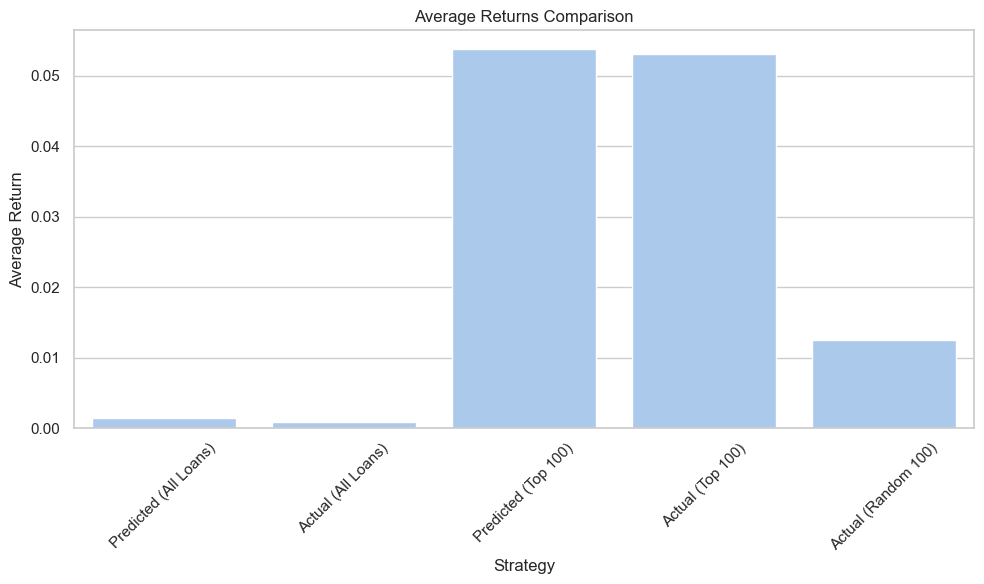

In [684]:
# Data
labels = [
    "Predicted (All Loans)",
    "Actual (All Loans)",
    "Predicted (Top 100)",
    "Actual (Top 100)",
    "Actual (Random 100)"
]
values = [
    preds.mean(),
    y_test.mean(),
    avg_predicted_top_100,
    avg_actual_top_100,
    avg_random_actual_return
]
# Set the style
sns.set(style="whitegrid")
# Set the color palette
sns.set_palette("pastel")
# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=labels, y=values)
# Add titles and labels
plt.title("Average Returns Comparison")
plt.ylabel("Average Return")
plt.xlabel("Strategy")
# Show the plot
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

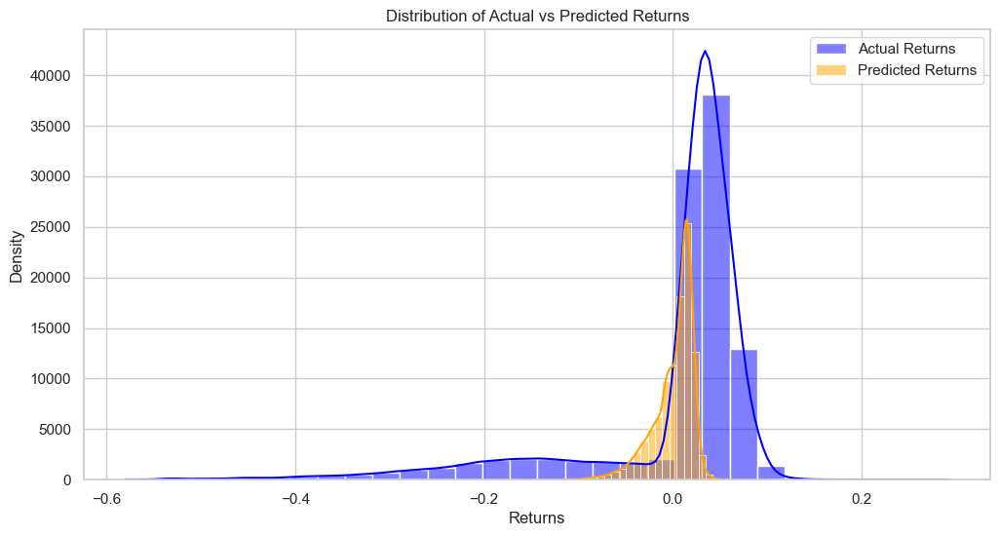

In [685]:
# plot for distribution of actual vs predicted returns
plt.figure(figsize=(12, 6))
sns.histplot(y_test, bins=30, kde=True, color='blue', label='Actual Returns')
sns.histplot(preds, bins=30, kde=True, color='orange', label='Predicted Returns')
plt.title("Distribution of Actual vs Predicted Returns")
plt.xlabel("Returns")
plt.ylabel("Density")
plt.legend()
plt.show()